<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Les-librairies-nécessaires" data-toc-modified-id="Les-librairies-nécessaires-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Les librairies nécessaires</a></span></li><li><span><a href="#Lecture-du-fichier-de-données" data-toc-modified-id="Lecture-du-fichier-de-données-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Lecture du fichier de données</a></span></li><li><span><a href="#Les-distributions-des-variables-quantitatives" data-toc-modified-id="Les-distributions-des-variables-quantitatives-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Les distributions des variables quantitatives</a></span></li><li><span><a href="#BarPlot" data-toc-modified-id="BarPlot-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>BarPlot</a></span></li><li><span><a href="#CatPlot" data-toc-modified-id="CatPlot-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>CatPlot</a></span></li><li><span><a href="#CountPlot" data-toc-modified-id="CountPlot-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>CountPlot</a></span></li><li><span><a href="#BoxPlot" data-toc-modified-id="BoxPlot-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>BoxPlot</a></span></li><li><span><a href="#ScatterPlot" data-toc-modified-id="ScatterPlot-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>ScatterPlot</a></span></li><li><span><a href="#LinePlot" data-toc-modified-id="LinePlot-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>LinePlot</a></span></li><li><span><a href="#LinePlot-ScaterPlot" data-toc-modified-id="LinePlot-ScaterPlot-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>LinePlot ScaterPlot</a></span></li><li><span><a href="#PairPlot" data-toc-modified-id="PairPlot-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>PairPlot</a></span></li></ul></div>

# Les librairies nécessaires

In [1]:
import pandas as pd, numpy as np, seaborn as sns
import warnings 
import os
from matplotlib import pyplot as plt

from datetime import datetime
warnings.filterwarnings(action="ignore")

%matplotlib inline


plt.style.use('seaborn-darkgrid')
sns.set(font_scale=3)

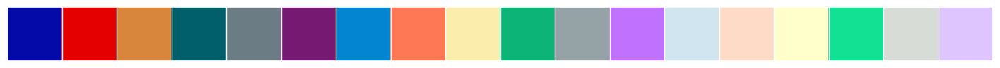

In [2]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
sns.palplot(sns.color_palette(palette))

# Lecture du fichier de données

In [3]:
donnees = pd.read_csv("donnees/export_sql.csv", sep=";")
donnees.PORT = donnees.PORT.apply(lambda x: str(x).replace(',','.')).astype('float32')
donnees.CA   = donnees.CA.apply(lambda x: str(x).replace(',','.')).astype('float32')
donnees.columns = list(map(lambda x: x.lower(),donnees.columns))
donnees.head()

,pays,province,annee,mois,fournisseur,categorie,quantites,port,ca
0,Espagne,Girona,2019,10,Exotic Liquids,Boissons,350,313.600006,18371.162109
1,Espagne,Girona,2019,10,Heli Süßwaren GmbH Co. KG,Desserts,296,306.399994,14257.975586
2,Espagne,Girona,2019,10,Lyngbysild,Poissons et fruits de mer,346,306.399994,18075.441406
3,Australie,Queensland,2019,11,Formaggi Fortini s.r.l.,Boissons,306,237.100006,12905.174805
4,Australie,New South Wales,2019,11,Bigfoot Breweries,Boissons,857,660.200012,33213.148438


In [4]:
donnees.to_parquet('donnees/export_sql.parquet')

In [5]:
donnees=pd.read_parquet('donnees/export_sql.parquet')

In [6]:
donnees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75120 entries, 0 to 75119
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   pays         75120 non-null  object 
 1   province     75120 non-null  object 
 2   annee        75120 non-null  int64  
 3   mois         75120 non-null  int64  
 4   fournisseur  75120 non-null  object 
 5   categorie    75120 non-null  object 
 6   quantites    75120 non-null  int64  
 7   port         75120 non-null  float32
 8   ca           75120 non-null  float32
dtypes: float32(2), int64(3), object(4)
memory usage: 4.6+ MB


In [7]:
donnees.describe()

,annee,mois,quantites,port,ca
count,75120.000000,75120.000000,75120.000000,75120.000000,75120.000000
mean,2017.945261,6.539776,295.768118,202.553268,17483.455078
std,0.791474,3.432156,264.056237,172.021469,16382.692383
min,2017.000000,1.000000,20.000000,50.000000,610.768005
25%,2017.000000,4.000000,125.000000,85.000000,6812.140747
50%,2018.000000,7.000000,211.000000,153.199997,12445.887695
75%,2019.000000,10.000000,382.000000,255.600006,22638.795898
max,2019.000000,12.000000,3990.000000,2572.800049,240960.593750


# Les distributions des variables quantitatives

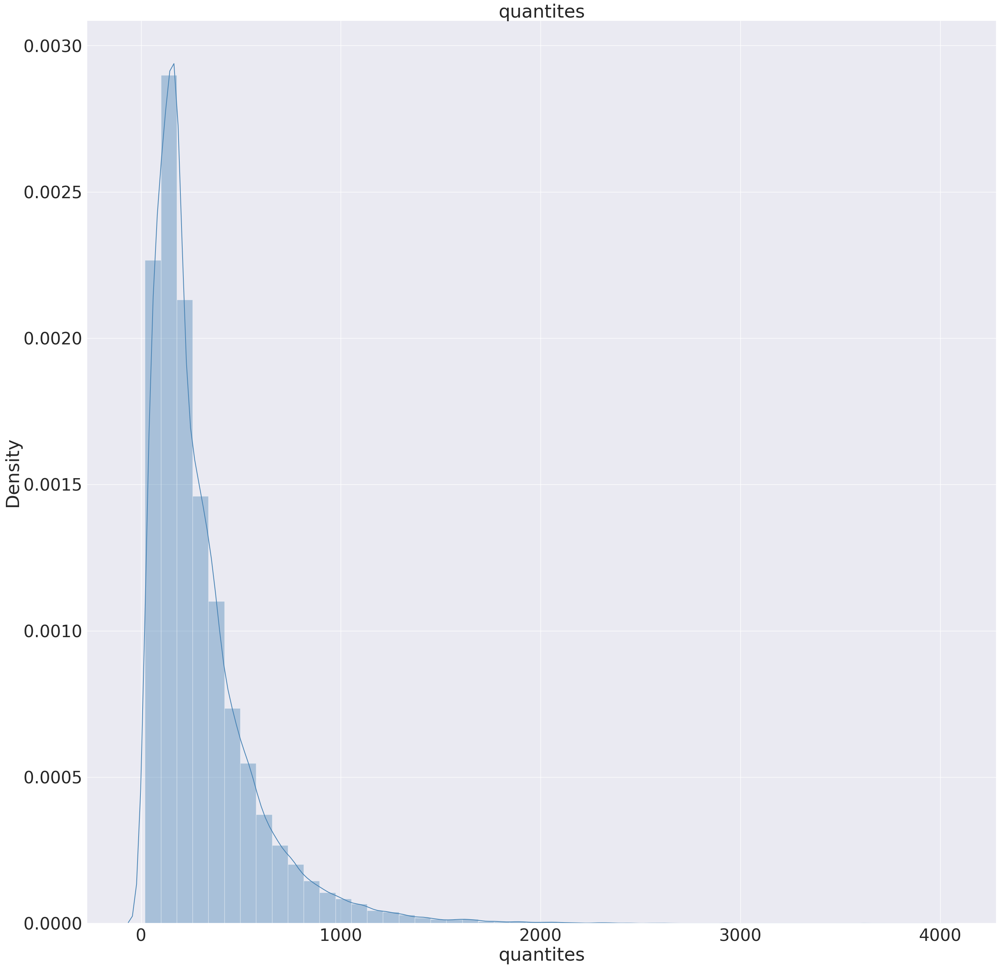

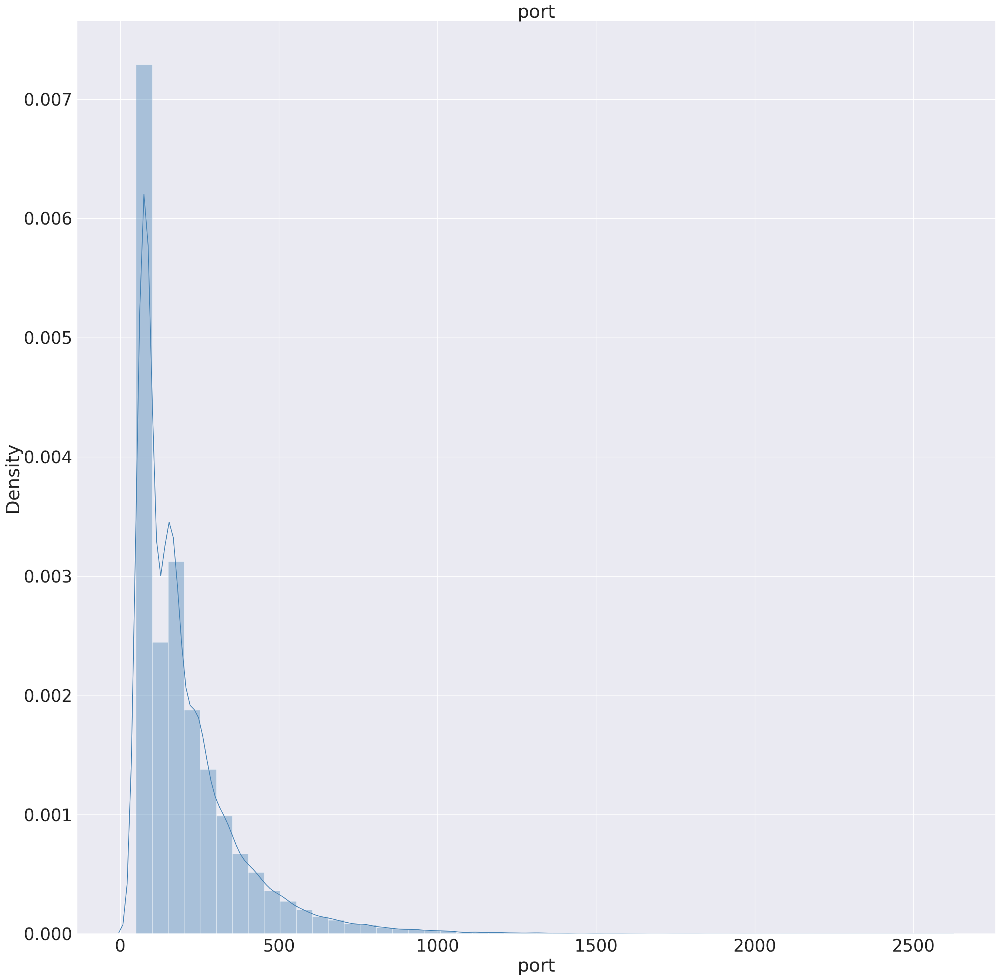

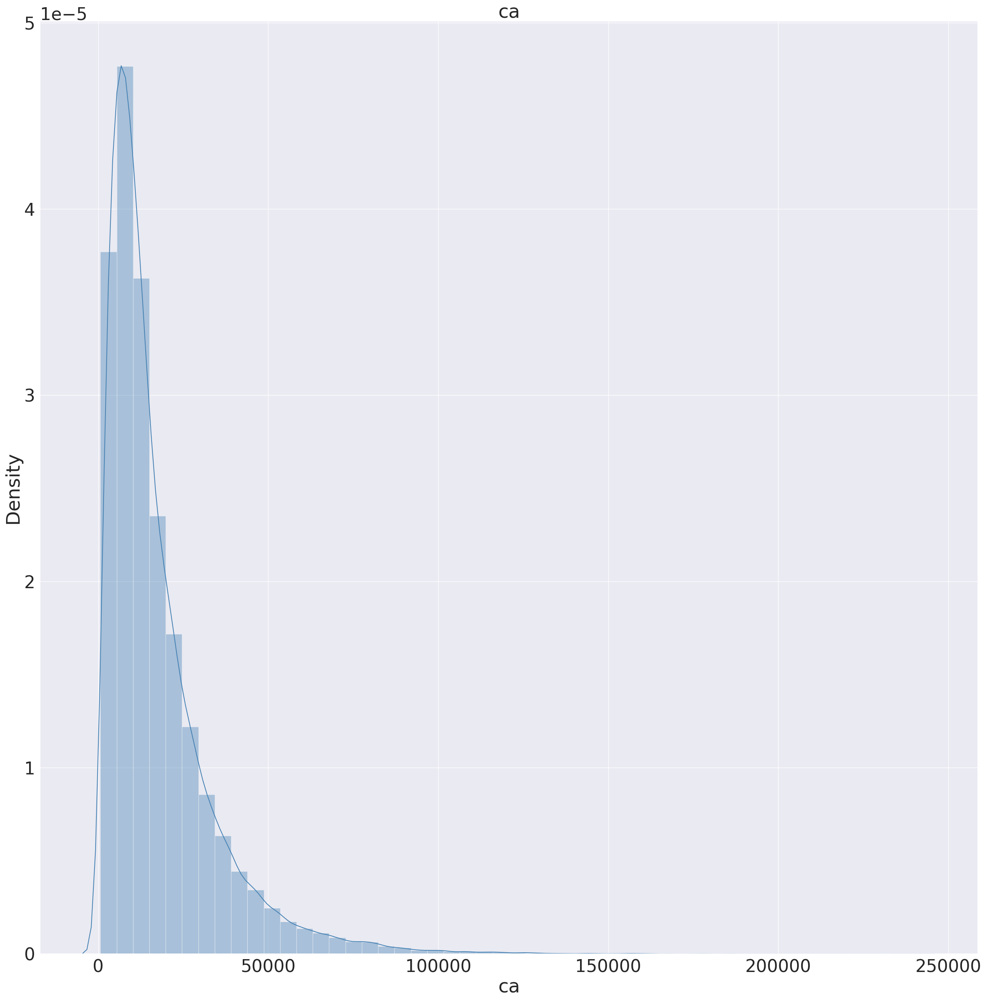

In [8]:
for colonne in ['quantites', 'port', 'ca']:
    plt.figure(figsize=(32,32))
    plt.title(colonne)
    sns.distplot(donnees[colonne], color="steelblue")
    plt.show()

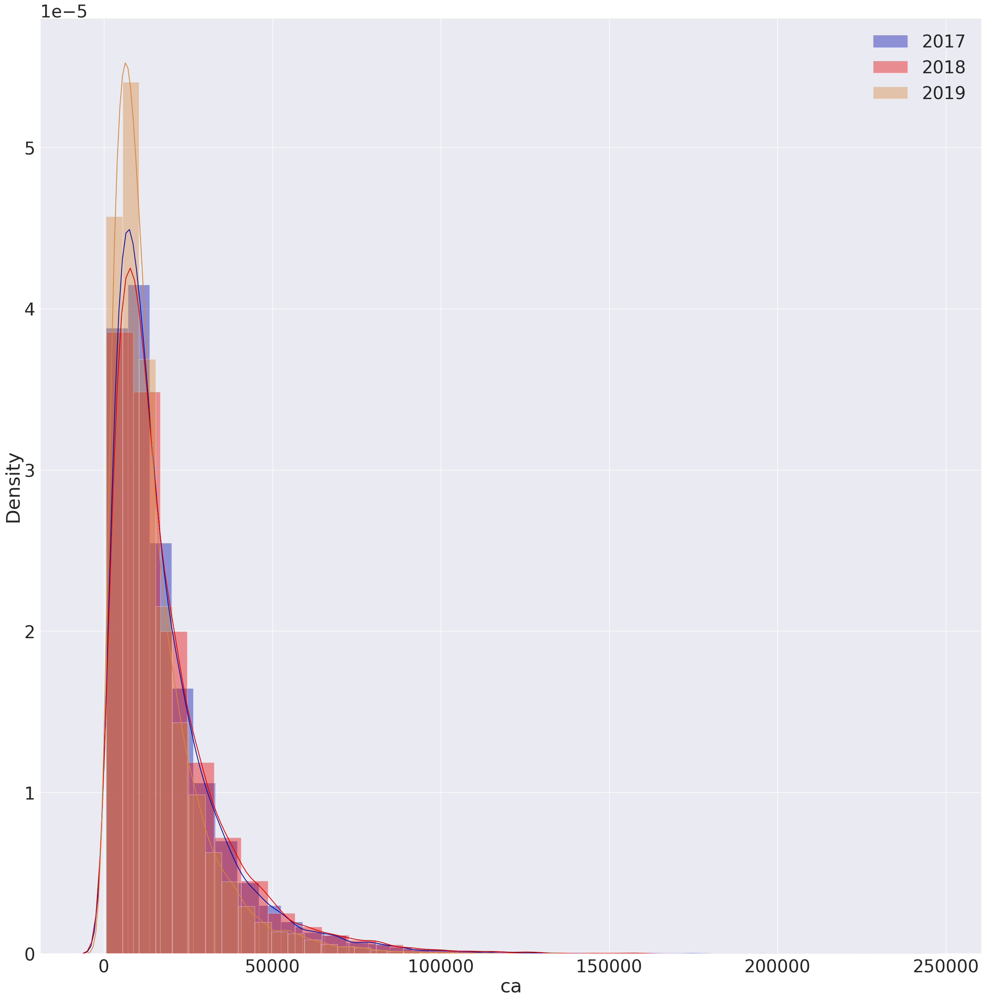

In [9]:
colonne = 'ca'
plt.figure(figsize=(32,32))
sns.distplot(donnees[colonne][donnees.annee == 2017],color=palette[0], label='2017', hist_kws=dict(alpha=0.4),bins=30)
sns.distplot(donnees[colonne][donnees.annee == 2018],color=palette[1], label='2018', hist_kws=dict(alpha=0.4),bins=30)
sns.distplot(donnees[colonne][donnees.annee == 2019],color=palette[2], label='2019', hist_kws=dict(alpha=0.4),bins=30)
plt.legend();

# BarPlot

In [10]:
donnees.groupby(['pays']).agg({'quantites':['sum','mean','std']}).head(10)

quantites                        
                  sum        mean         std
pays                                         
Allemagne     3513087  321.328730  275.934158
Australie     1917714  409.943138  382.562018
Brésil        1273700  306.104302  263.558221
Canada         612557  292.949307  250.724501
Danemark       455152  234.131687  187.618348
Espagne        850147  252.044767  206.213000
France        1910002  254.768841  212.813486
Italie        3680638  301.296496  282.050289
Japon          892588  348.123245  278.494819
Royaume-Uni   1185406  282.306740  236.217575

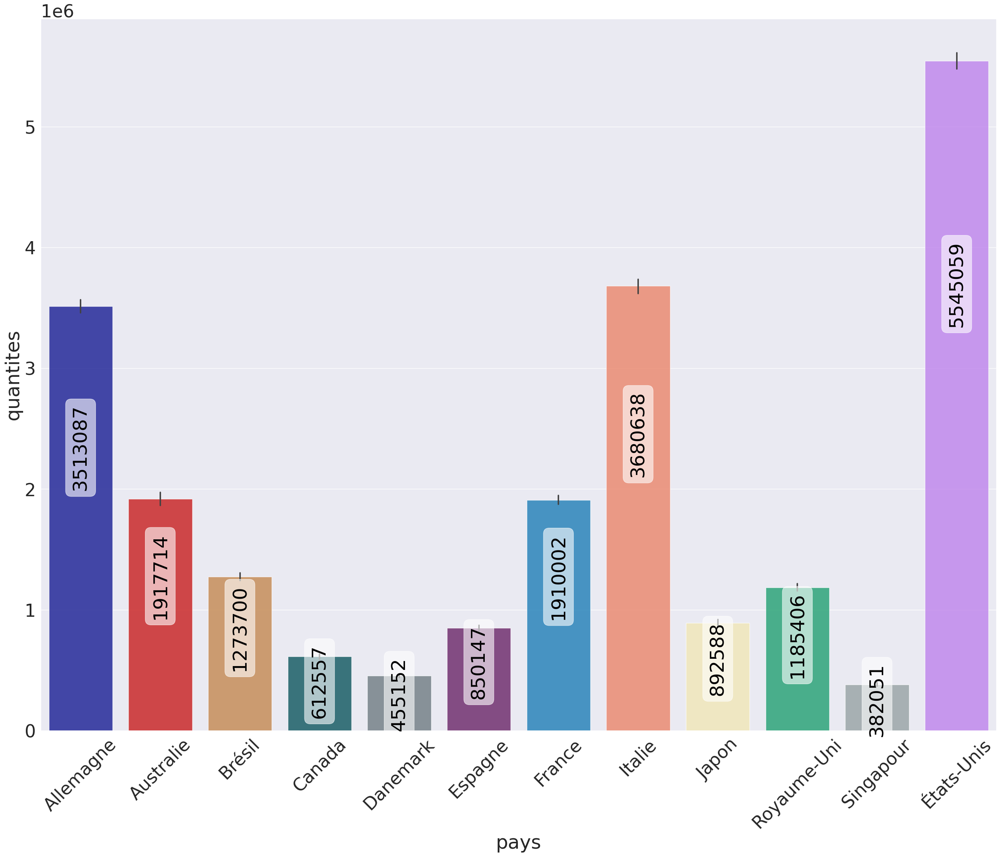

In [35]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='pays',y='quantites',data=donnees.sort_values('pays'),palette=palette,alpha=0.8,estimator='sum')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);

for i,nb in enumerate(donnees.groupby('pays').quantites.sum().sort_index().values):
    gbarplot.text(
                i ,
                nb-nb//3,
                nb,
                color='black',
                rotation='vertical',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )

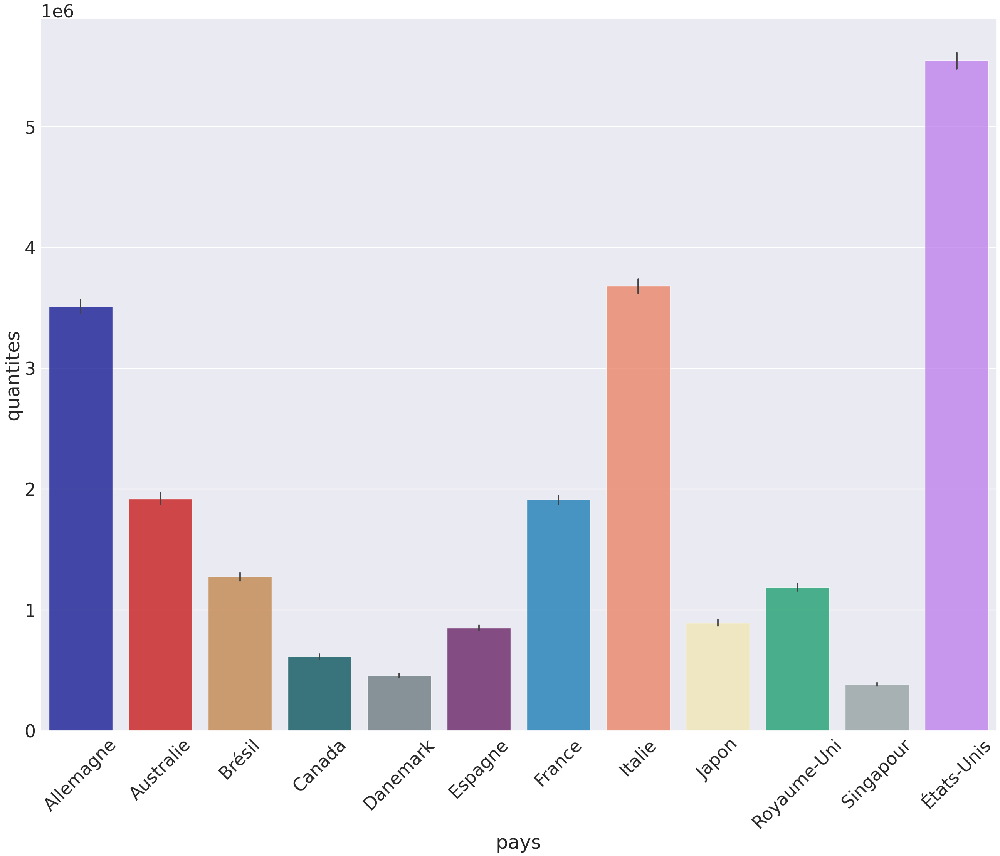

In [36]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='pays',y='quantites',data=donnees.sort_values('pays'),
                       palette=palette,alpha=0.8,estimator='sum')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);

In [44]:
donnees.groupby(['pays']).agg({'quantites':['sum','mean','std']}).head(10)

quantites                        
                  sum        mean         std
pays                                         
Allemagne     3513087  321.328730  275.934158
Australie     1917714  409.943138  382.562018
Brésil        1273700  306.104302  263.558221
Canada         612557  292.949307  250.724501
Danemark       455152  234.131687  187.618348
Espagne        850147  252.044767  206.213000
France        1910002  254.768841  212.813486
Italie        3680638  301.296496  282.050289
Japon          892588  348.123245  278.494819
Royaume-Uni   1185406  282.306740  236.217575

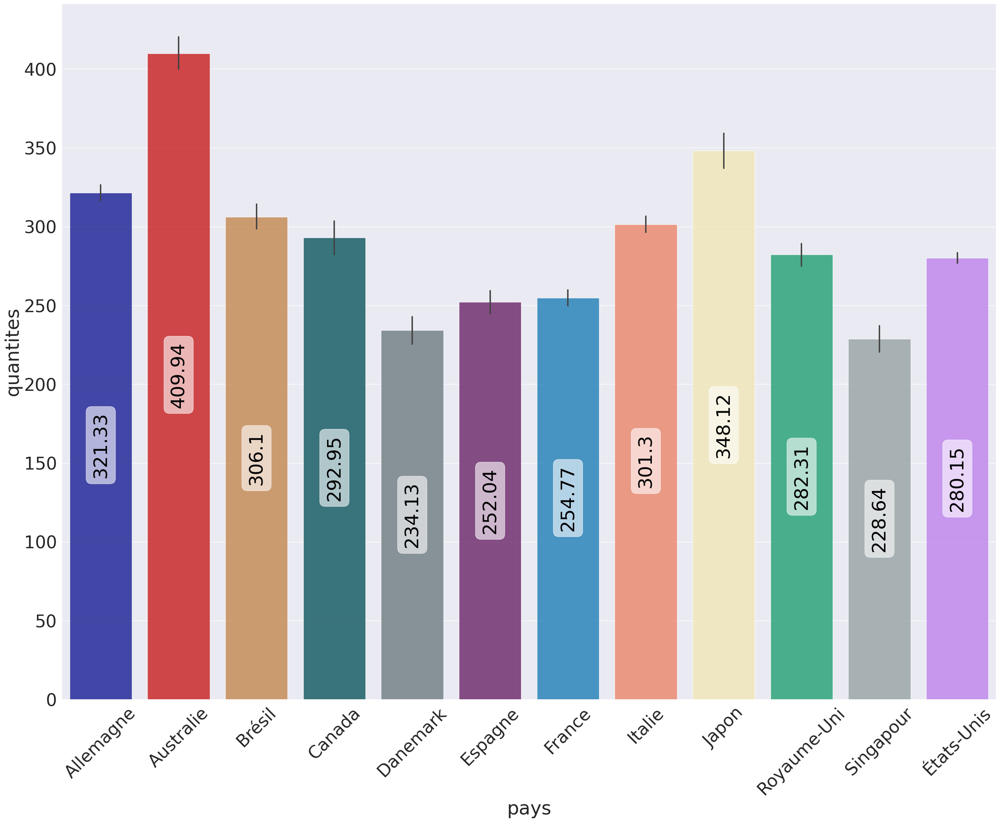

In [45]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='pays',y='quantites',data=donnees.sort_values('pays'),
                       palette=palette, alpha=0.8, estimator='mean')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);

for i,nb in enumerate(donnees.groupby('pays').quantites.mean().sort_index().values):
    gbarplot.text(
                i ,
                nb-nb//2,
                round(nb,2),
                color='black',
                rotation='vertical',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )
    

In [47]:
donnees.groupby(['pays']).agg({'quantites':['sum','mean','std']}).head(10)

quantites                        
                  sum        mean         std
pays                                         
Allemagne     3513087  321.328730  275.934158
Australie     1917714  409.943138  382.562018
Brésil        1273700  306.104302  263.558221
Canada         612557  292.949307  250.724501
Danemark       455152  234.131687  187.618348
Espagne        850147  252.044767  206.213000
France        1910002  254.768841  212.813486
Italie        3680638  301.296496  282.050289
Japon          892588  348.123245  278.494819
Royaume-Uni   1185406  282.306740  236.217575

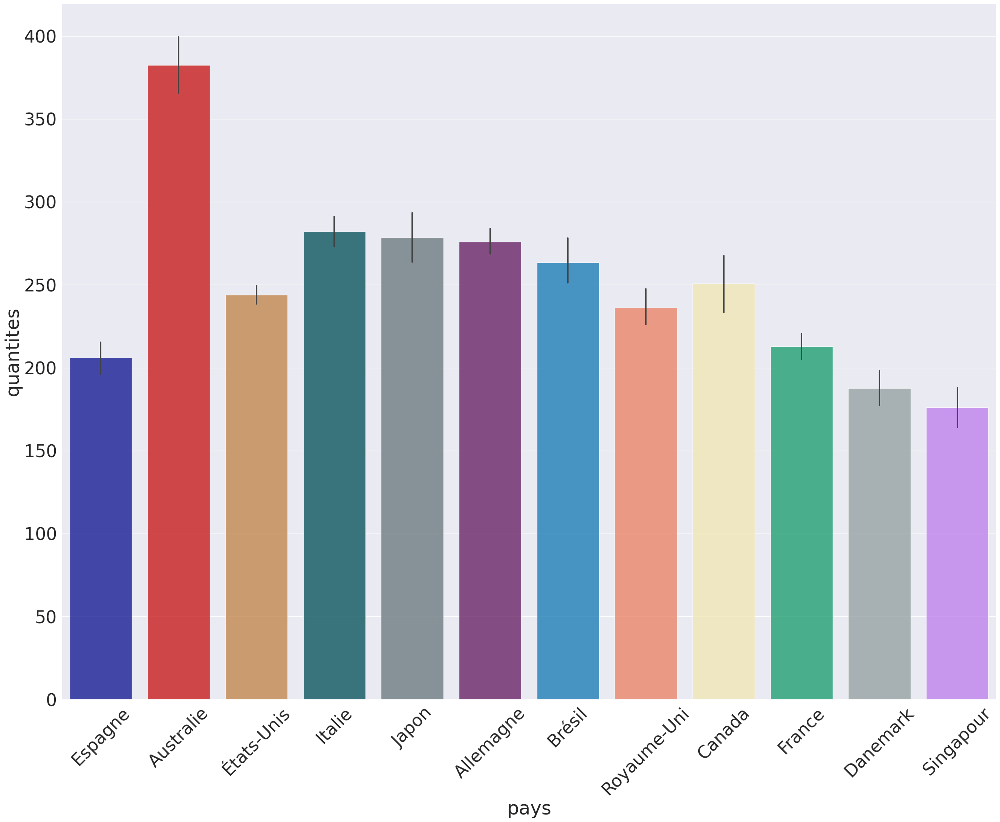

In [13]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='pays',y='quantites',data=donnees, palette=palette, alpha=0.8, estimator=np.std)
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);

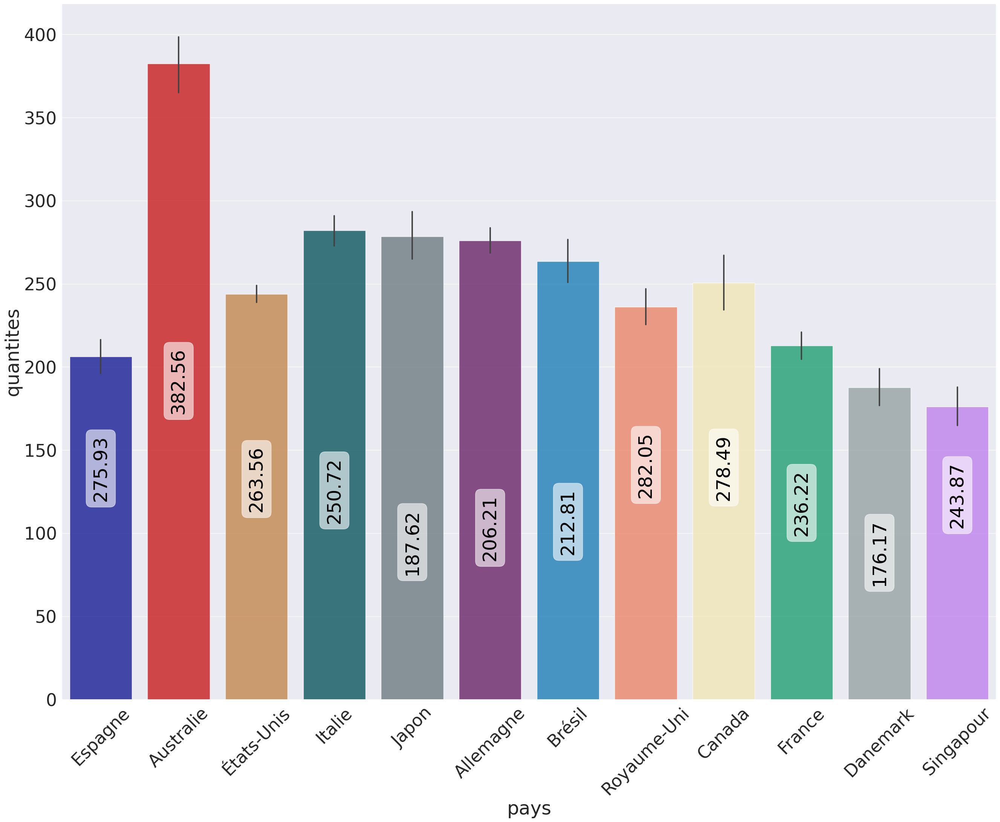

In [46]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='pays',y='quantites',data=donnees, palette=palette, alpha=0.8, estimator=np.std)
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);


for i,nb in enumerate(donnees.groupby('pays').quantites.std().sort_index().values):
    gbarplot.text(
                i ,
                nb-nb//2,
                round(nb,2),
                color='black',
                rotation='vertical',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )

# CatPlot

In [14]:
donnees.groupby(['pays','annee']).agg({'port':['mean','std']}).head(10)

port            
                       mean         std
pays      annee                        
Allemagne 2017   234.759155  188.417866
          2018   243.104202  205.209307
          2019   181.712189  145.327849
Australie 2017   272.298309  232.296277
          2018   320.641693  273.431605
          2019   237.788544  204.777419
Brésil    2017   230.076889  200.703129
          2018   210.826385  158.051619
          2019   197.651566  158.438157
Canada    2017   201.453354  153.046981

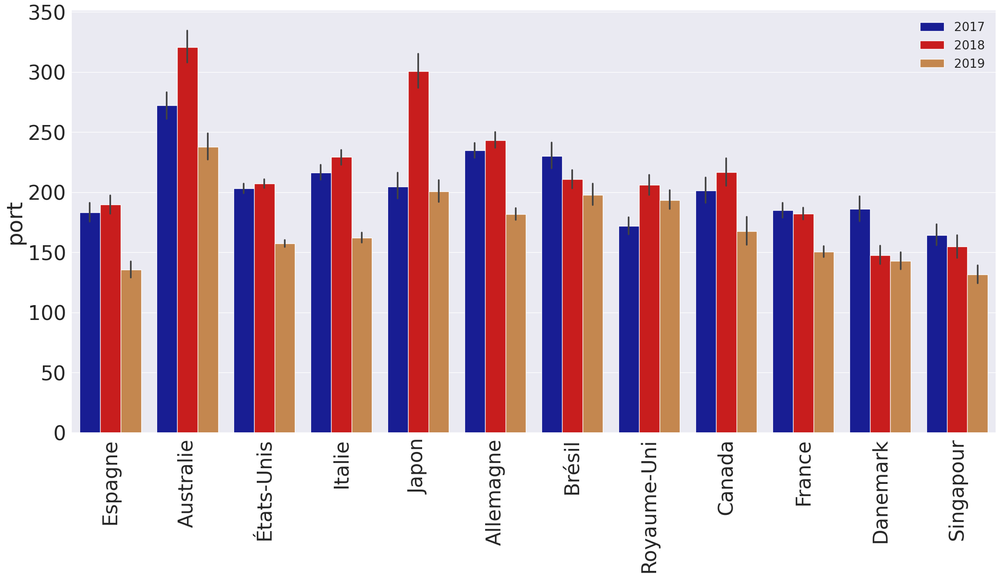

In [29]:
graph = sns.catplot(x="pays", 
                    y="port", 
                    hue="annee", 
                    data=donnees,
                    height=12, 
                    kind="bar", 
                    aspect=2,
                    palette=palette,
                    legend=False);

graph.despine(left=True);
graph.set_xticklabels(rotation=90);
graph.set_xlabels('');
# graph.set_ylabels('');
plt.legend(loc='upper right', title_fontsize=20, fontsize=20);

# CountPlot

In [16]:
donnees.groupby(['pays']).agg({'port':['count']})

,port
,count
pays,
Allemagne,10933
Australie,4678
Brésil,4161
Canada,2091
Danemark,1944
Espagne,3373
France,7497
Italie,12216


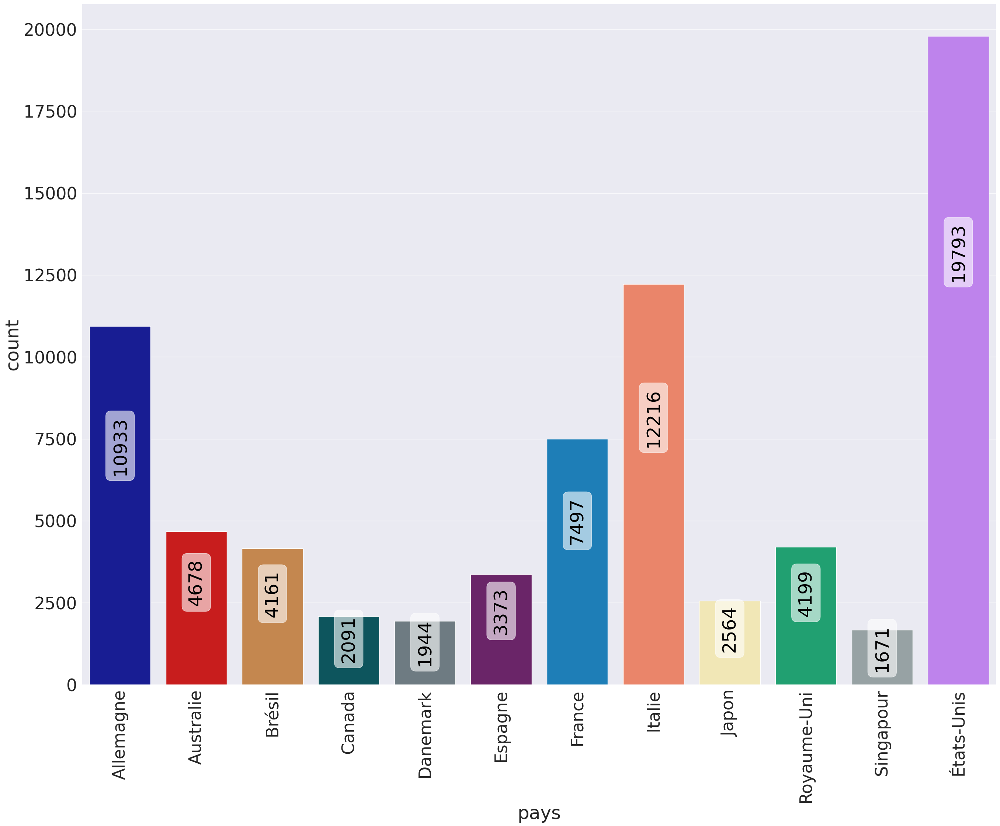

In [17]:
plt.figure(figsize=(32,24))
graph = sns.countplot(x='pays',
                      data=donnees, 
                      order=donnees.pays.sort_values().unique(),
                      palette=palette);

for i,nb in enumerate(donnees.groupby('pays').port.count().sort_index().values):
    graph.text(
                i ,
                nb-nb//3,
                nb,
                color='black',
                rotation='vertical',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )
    
graph.set_xticklabels(donnees.pays.sort_values().unique(),rotation=90);

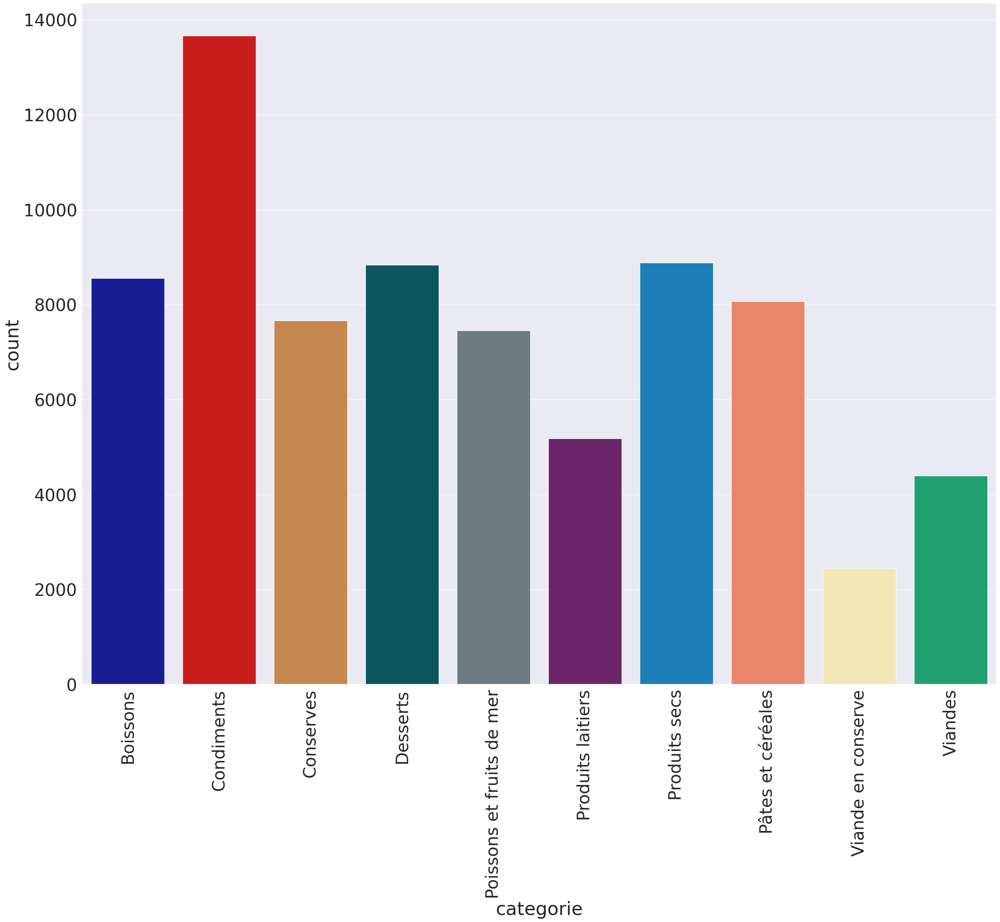

In [18]:
plt.figure(figsize=(32,24))
graph = sns.countplot(x='categorie',
                      data=donnees.sort_values('categorie'), 
                      palette=palette);
graph.set_xticklabels(donnees.sort_values('categorie').categorie.unique(),rotation=90);

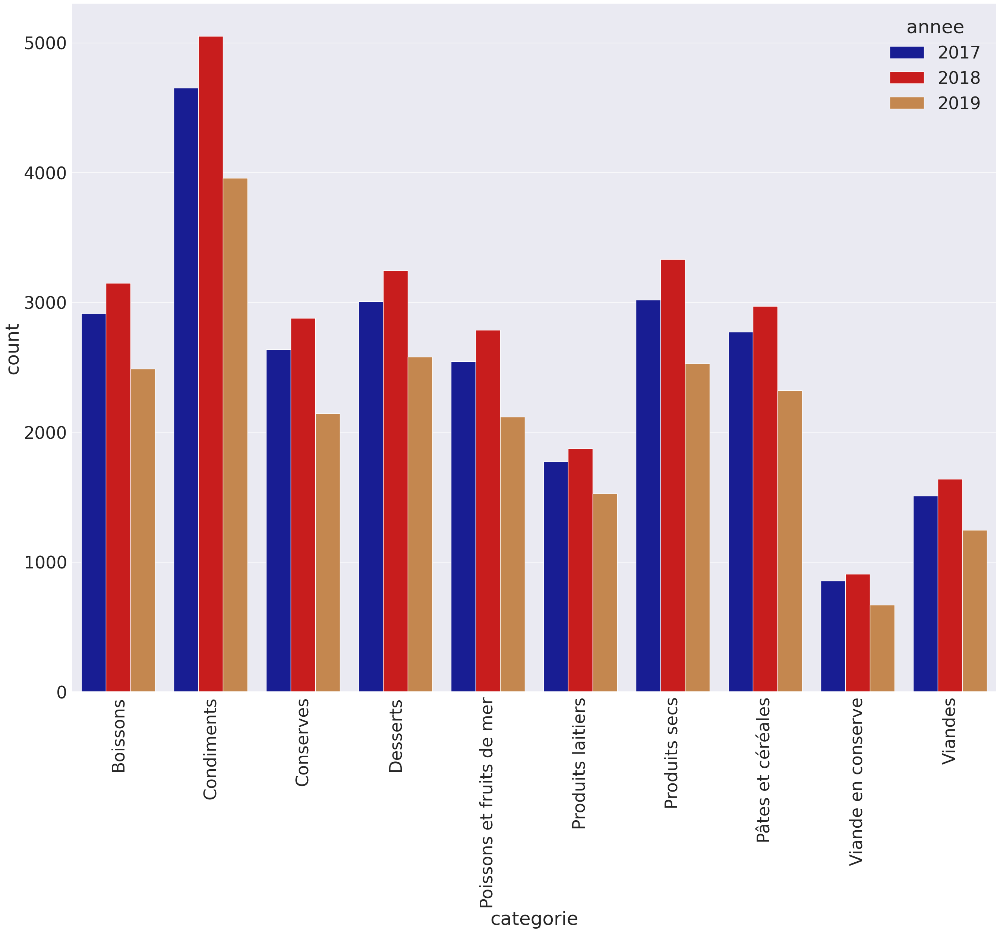

In [19]:
plt.figure(figsize=(32,24))
graph = sns.countplot(x='categorie',
                      hue='annee',
                      data=donnees.sort_values('categorie'), 
                      palette=palette);
graph.set_xticklabels(donnees.sort_values('categorie').categorie.unique(),rotation=90);

# BoxPlot

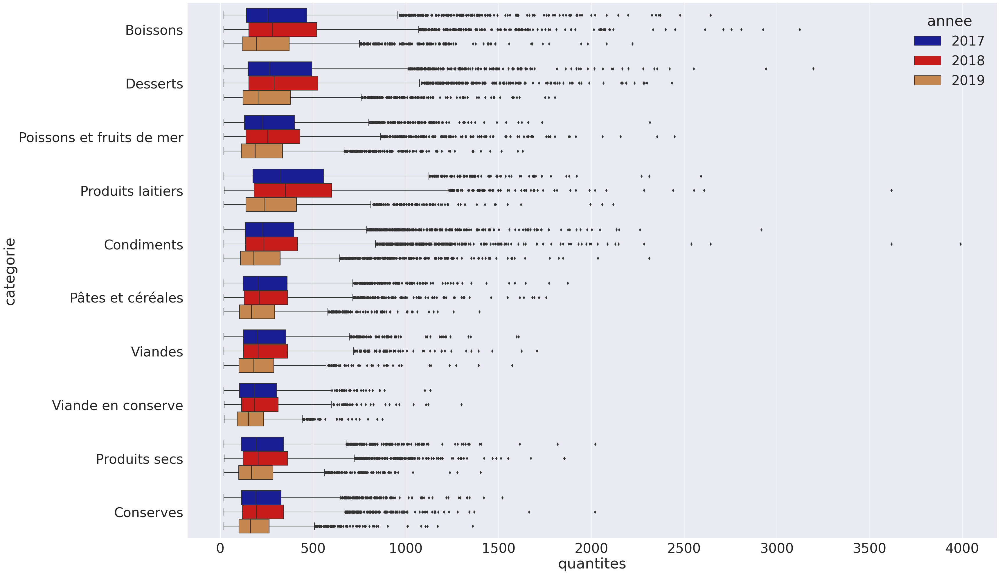

In [20]:
plt.figure(figsize=(36,24))
sns.boxplot(x='quantites',y='categorie',data=donnees,hue='annee', palette=palette);

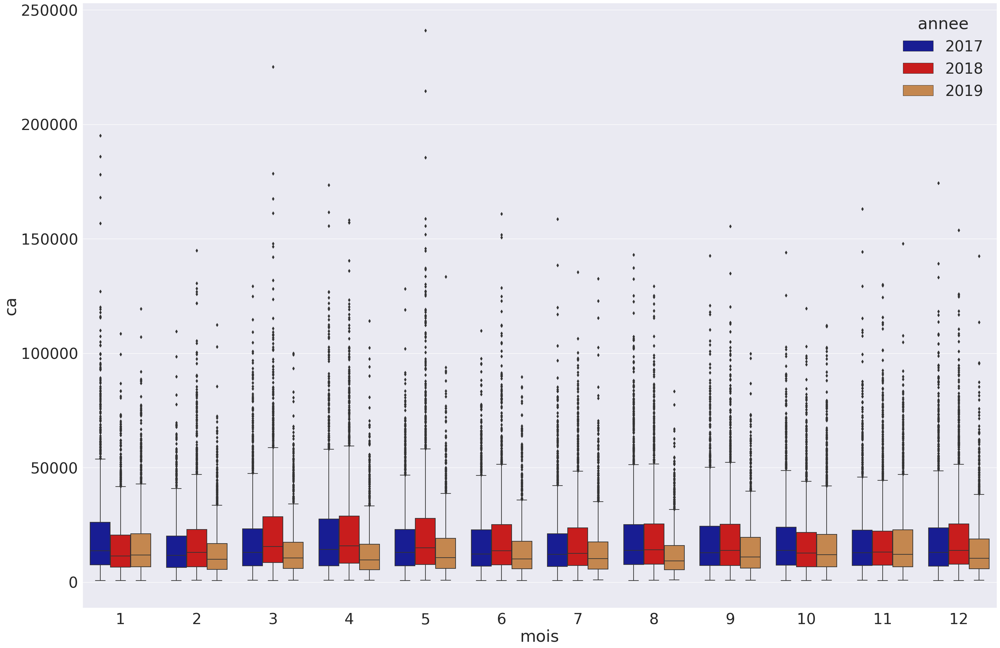

In [21]:
plt.figure(figsize=(36,24))
sns.boxplot(x='mois',y='ca', hue='annee', data=donnees, palette=palette);

# ScatterPlot

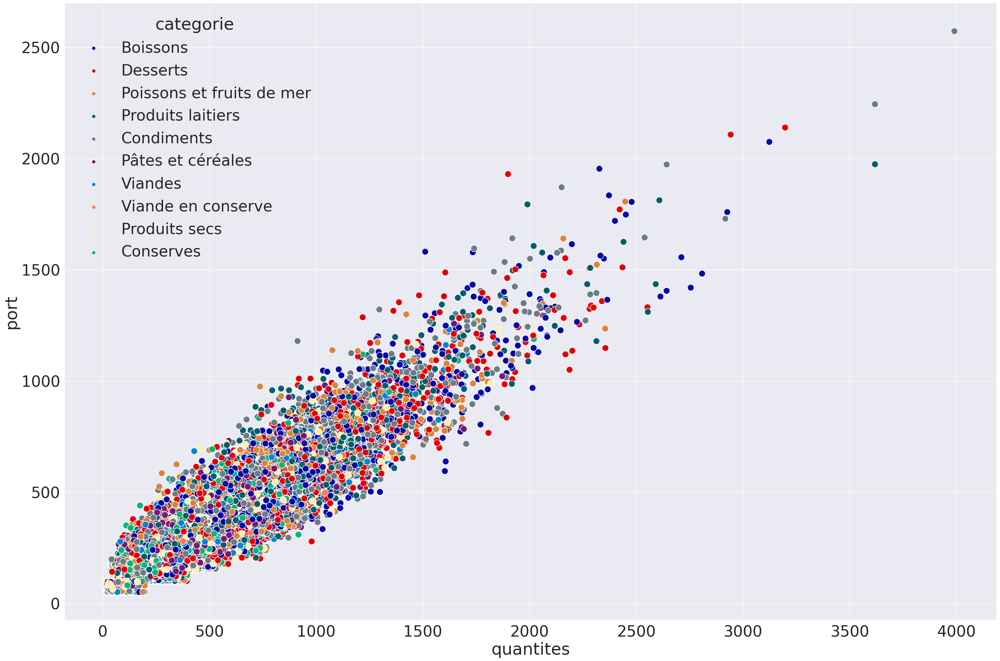

In [22]:
plt.figure(figsize=(36,24))
sns.scatterplot(x     = 'quantites',
                y     = 'port',
                hue   = 'categorie', 
                data  = donnees,
                s     = 200,
                palette= palette,
                );

In [23]:
d=donnees.groupby(['annee','pays']).agg({'port':['sum']}).reset_index()
d.columns=['annee','pays','port']
d.head()

,annee,pays,port
0,2017,Allemagne,851941.000000
1,2017,Australie,448475.312500
2,2017,Brésil,302781.187500
3,2017,Canada,152903.093750
4,2017,Danemark,123692.796875


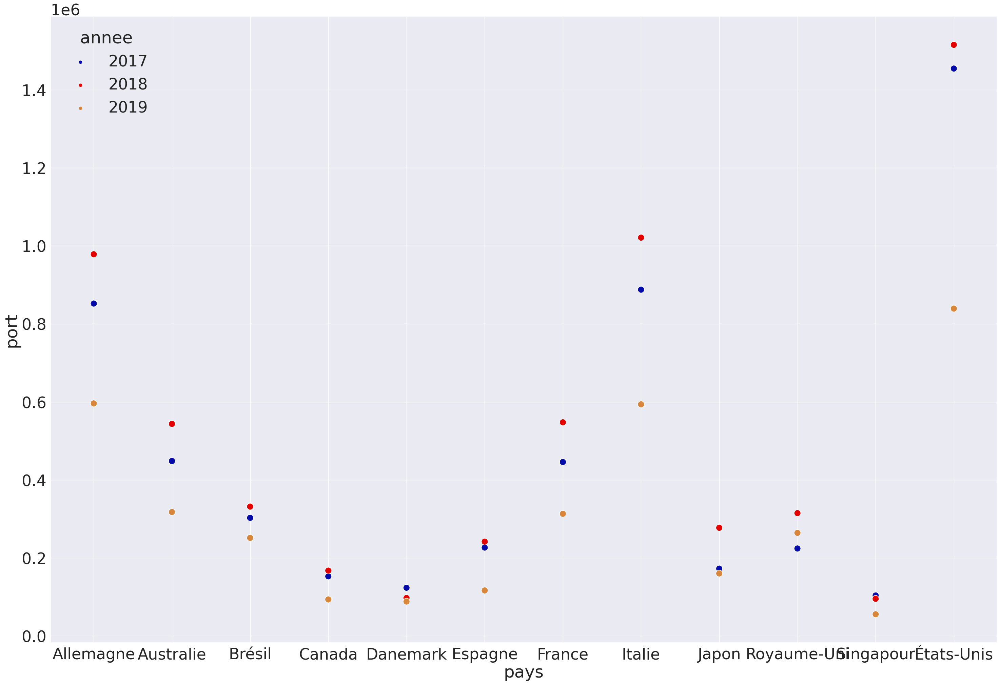

In [24]:
plt.figure(figsize=(36,24))
sns.scatterplot(x     = 'pays',
                y     = 'port',
                hue   = 'annee', 
                data  = d,
                s     = 200,
                palette= palette,
                );

In [25]:
d.annee = d.annee.astype("category")

In [26]:
d.pays = d.pays.astype("category")

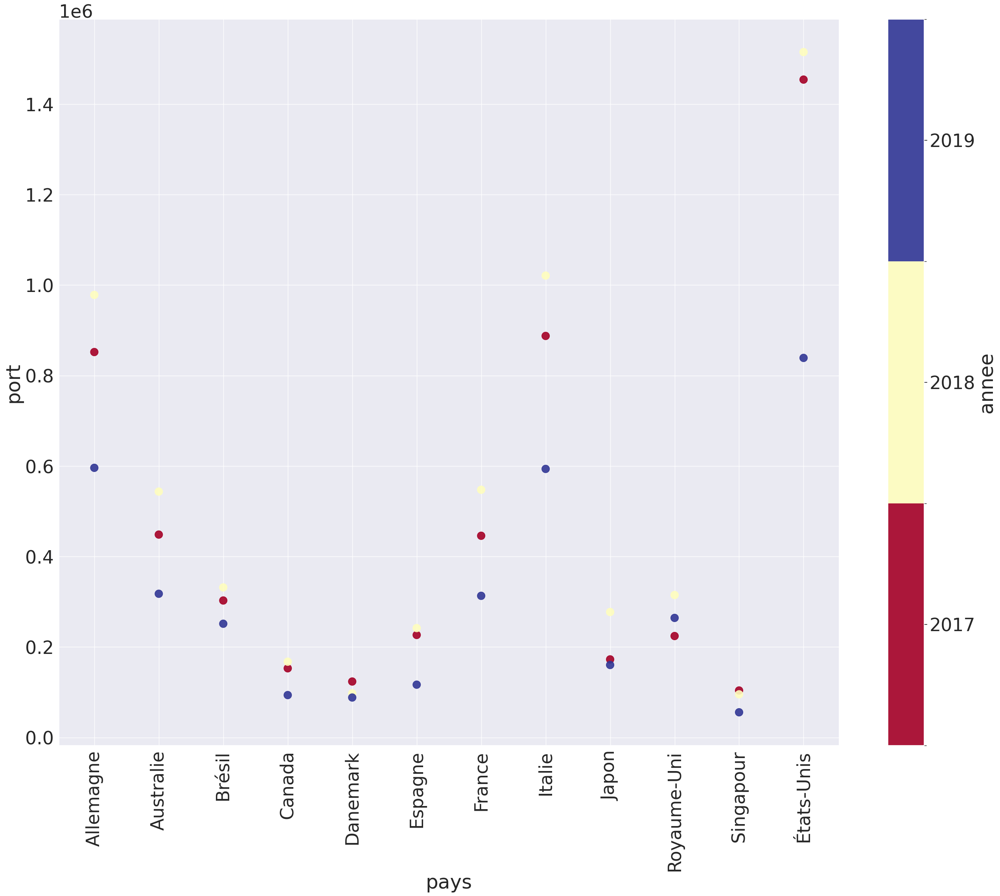

In [27]:
d.plot.scatter(x = 'pays',y = 'port',c='annee',figsize=(32,24), alpha=0.9, s=200, cmap=plt.cm.get_cmap('RdYlBu'))
plt.xticks(rotation = 90);

# LinePlot

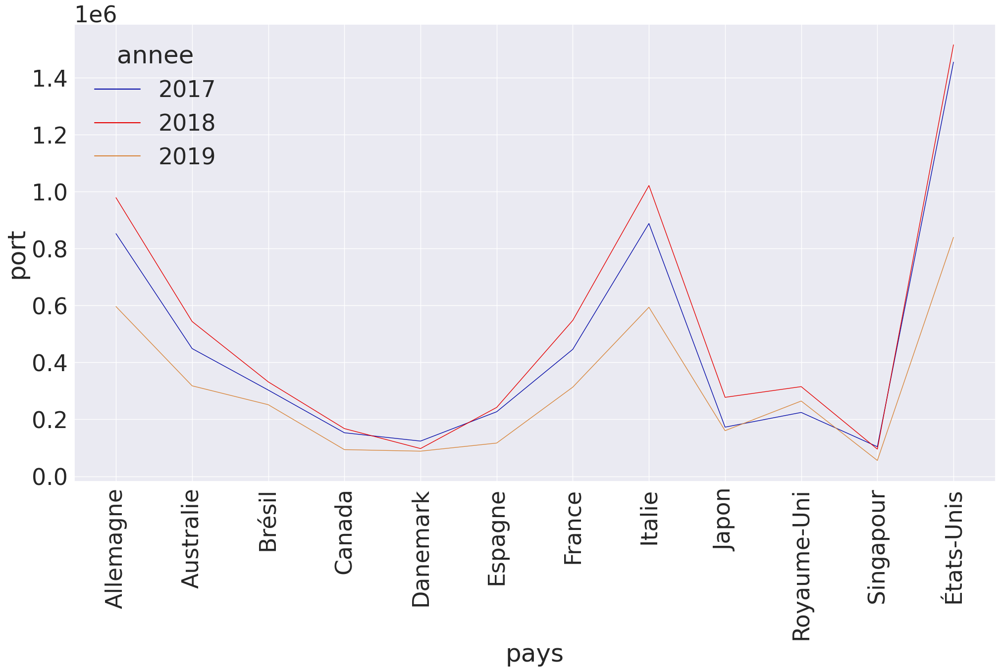

In [28]:
plt.figure(figsize=(24,12))

ax = sns.lineplot(x  ='pays',
                  y  ='port',
                  hue='annee',             
                  data=d, 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
ax.set_xticklabels(d.pays,rotation=90);

# LinePlot ScaterPlot

In [75]:
donnees.assign(
                 annee_mois = donnees.annee.astype('str')+donnees.mois.apply(lambda x:f'{x:02d}')
                ).groupby(
                          ['annee_mois']
                         ).agg(
                               {'quantites':['mean']
                                 }).head(10)

,quantites
,mean
annee_mois,
201701,337.609103
201702,257.193293
201703,299.823326
201704,348.001732
201705,289.297365
201706,290.078934
201707,279.986605
201708,328.755508


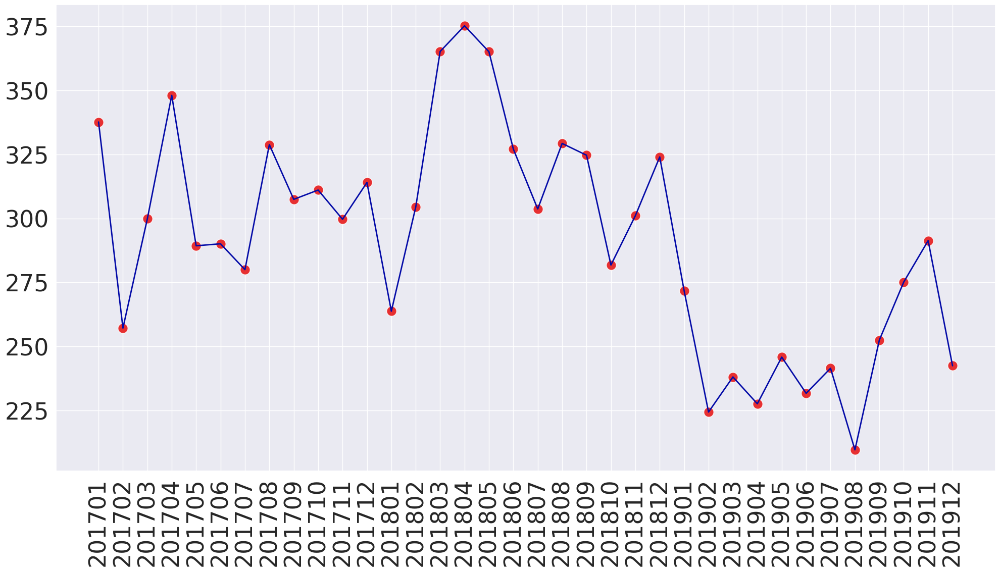

In [73]:
calcul = donnees.assign(
                 annee_mois = donnees.annee.astype('str')+donnees.mois.apply(lambda x:f'{x:02d}')
                ).groupby(
                          ['annee_mois']
                         ).agg(
                               {'quantites':['mean']
                                 }).reset_index()
calcul.columns = ['annee_mois','quantites']


plt.figure(figsize=(24,12))

graph = sns.lineplot( x         = "annee_mois", 
                      y         = "quantites", 
                      data      = calcul, 
                      estimator = None, 
                      lw        = 2, 
                      ci        = None,
#                       label     = nom,
                      color     = palette[0])
sns.scatterplot( x     = "annee_mois", 
                     y     = "quantites", 
                     data  = calcul, 
                             alpha =  0.8,   
                     s     = 200,
        #              ci    = None, 
                     color = palette[1],
                     ax    = graph,
                         );
                             
graph.set_xlabel('');
graph.set_ylabel('');    
graph.set_xticklabels(calcul.annee_mois,rotation=90);

# PairPlot

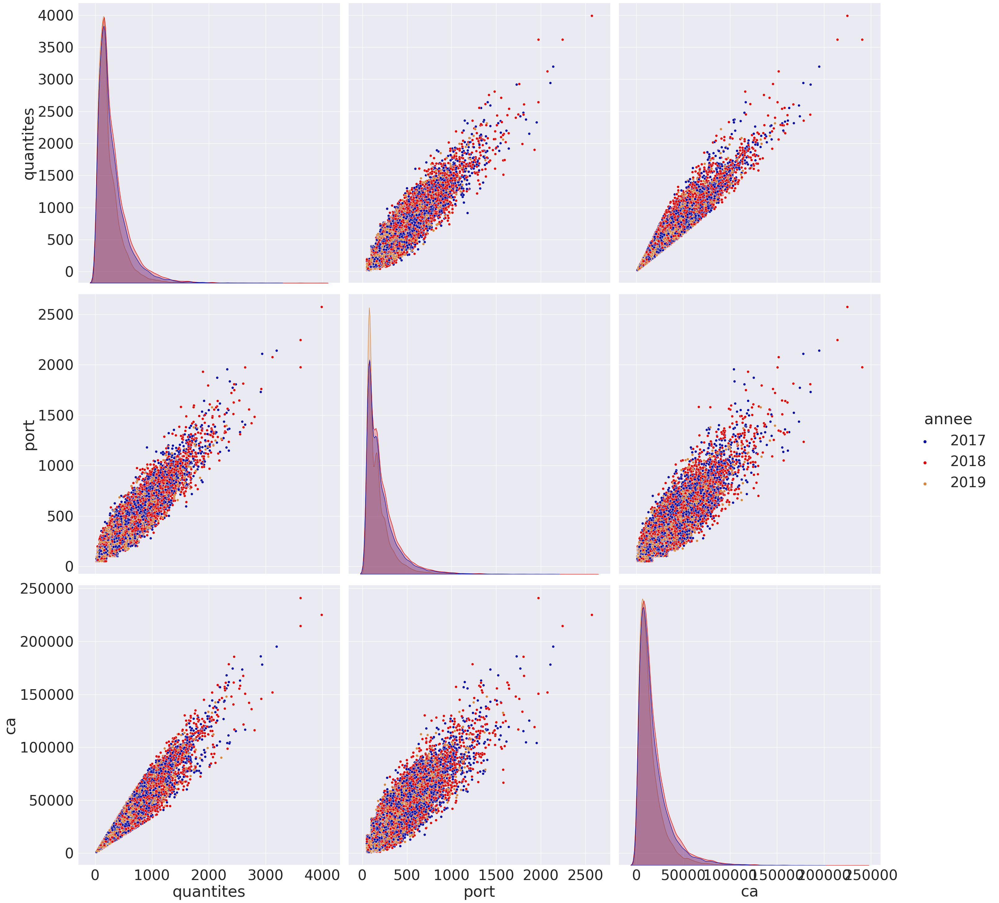

In [76]:
sns.pairplot(data=donnees.drop(columns='mois'),hue='annee',size=10,palette=palette);

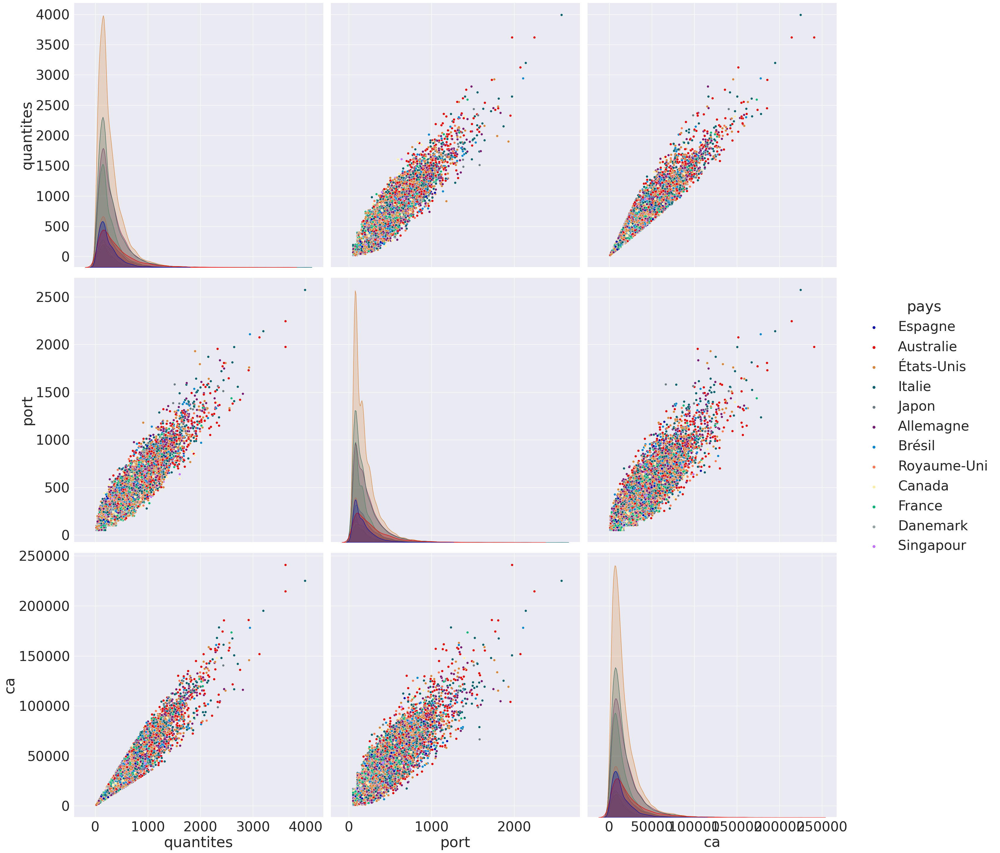

In [78]:
sns.pairplot(data=donnees.drop(columns=['annee','mois']),hue='pays',size=10,palette=palette);

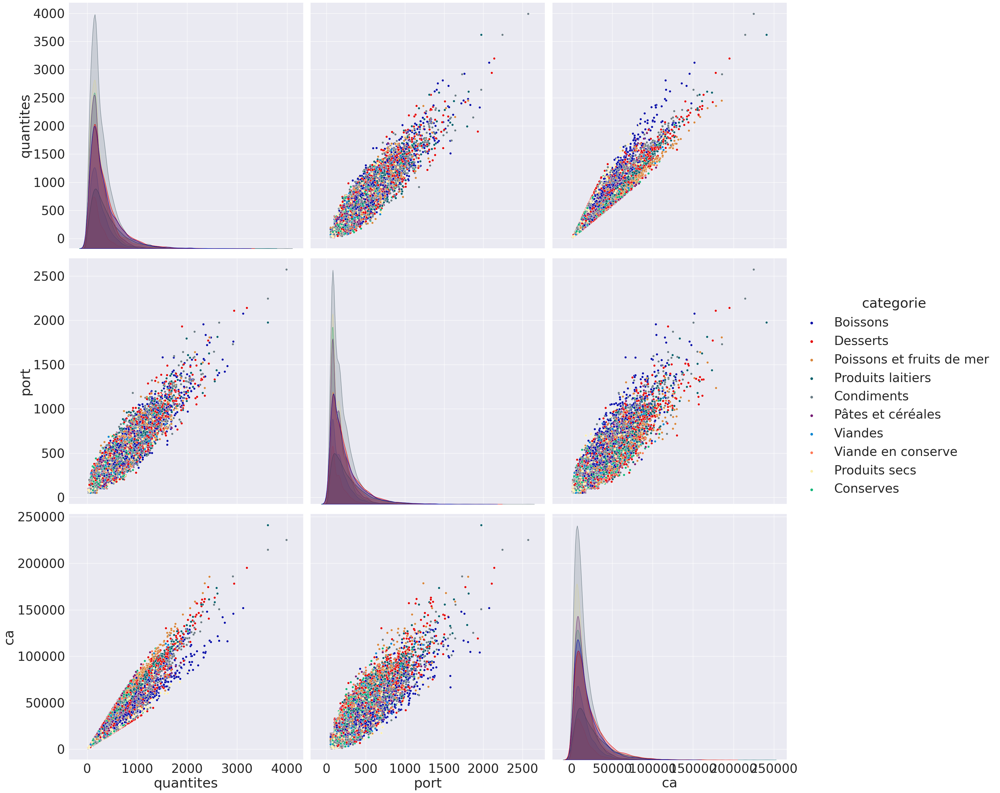

In [79]:
sns.pairplot(data=donnees.drop(columns=['annee','mois']),hue='categorie',size=10,palette=palette);